## Module 3 Project: Automatic lithoclassification of unconsolidated sediments 

## 1. Introduction


In the frame of Sebastian Schaller's PhD project, a large data set of several sedimentological, geophysical, and chemical logs (here, logs can be thought of as 'features' in a dataset) were collected from a 252-meter-long sediment drill core. The unconsolidated sediments in the log are classified into several lithoclastic types (e.g. sand, or fine clays). These are traditionally classified by visual inspection of the entire sediment core, relying heavily on geologic intuition and knowledge. The goal of the M2 and M3 projects is to set the foundation for a machine learning model that can perform a log-based classification of unconsolidated quaternary sediments. Such a model would classify the sediments based on their physical properties (i.e. the log data), hopefully obtaining a result that matches reasonably well the visual classification. This would have several advantages:

- Core drilling is expensive ~1000 sFr/m
- It takes a lot of time to analyze and describe -> 1-2 years from drilling to a proper stratigraphic profile
- A combination of much cheaper destructive drilling with wireline logging would be able to obtain the same logs but it wouldn't keep the core intact. This dataset could then be run through the ML model to reconstruct the stratigraphy

       
**Module 2 Project**

During the Module 2 project, and as a first step, three MSCL (Multi Sensor Core Logging) logs - wet bulk density, magnetic susceptibility, natural gamma radiation - are compared. These represent the most complete dataset and have a very close measurement spacing of 0.5 cm. Further, they are measured directly at the cores, and therefore are directly comparable with the visual core description. In module 2, the data is described statistically, and patterns are observed, keeping in mind the visual-based classification which will later be compared with the data-based clustering. This can help to estimate the impact of the different logs on the future ML-based classification. 

***M2 Data Analysis***

- Data collection
    - MSCL-core-log data
- Description of the data (for each individual log)
    - Distribution of quality and lithology
    - Calculate mean and std
    - Log data is normally distributed, -> no trend in/homogeneous data set (0-hypothesis-1)
        - Test normality of whole distribution (D`Agostino-Pearson-Test)
        - Test normality of individual sub-datasets (lithological groups) (D`Agostino-Pearson-Test)
    - Distribution of the sub-datasets (based on visible core descriptions) is randomly distributed (0-hypothesis-2)
        - Test similarities of litho groups of each log (Kruskal-Wallis test) 
        - pair-wise comparison of each possible combination of the litho groups (Mannä-Whitney-U test)
    - Choose appropriate data visualisation

*Statistical significance level*:
P-values below 0.001 ar considered as  unlikely enough to reject the 0-hypothesis. 
    
***M2 Conclusions*** 
- Distribution of log data:
    - Log data is not normally distributed -> q-q plots and D`Agostino-Pearson-Test
    - Sub-datasets are also not normally distributed -> q-q plots and D`Agostino-Pearson-Test
- Distribution of litho groups inside the entire log dataset:
    - They are not normally distributed. This makes geological sense, and shows no overlap -> Kruskal-Wallis test and Mann-Whitney-U test
- Judging similarities between the visual lithological classification of the core and the scatter plots.
    - Clustering is visible and backed by geological knowledge
- Qualitatively judging the value/impact of the analyzed logs on the data clustering (input for larger project: developing a geophysical and chemical borehole/drillcore log-based classification system for unconsolidated quaternary sediments):
    - The density and Natural gamma logs clearly appear to influence the clustering, whereas magnetic susceptibility does not appear to have much impact on clustering by this type of sediments (heterogeneous, reworked, etc.)
    - Possible options to add other logs into the analysis: 
        - Resistivity
        - Porosity

**Module 3 Project**

For module 3 the next steps are taken for a full ML-based sediment classification model. Namely, ML-based clustering algorithms are tested on the MSCL logs and the core depth. 

***Module 3 Objectives*** 

1. Visualise the data in such a way that the visually-classified clusters are distinguishable
2. Attempt to find patterns in the data independent of the visual classification through unsupervised clustering algorithms. Two approaches are attempted: 
    - Direct clustering by several algorithms such as K-Means, DBSCAN and HDBSCAN
    - PCA-analysis for dimensionality reduction followed by K-Means clustering
3. Compare the visual-based classification of the sediments (classic geological route) with a semi-automated data-based clustering of the logs (using clustering techniques or PCA) 

![screenshot_main_profile_reviewed.JPG](/Users/pbecerra/Library/CloudStorage/Dropbox/UNIBE/CAS/ADS_course/Module3/M3project/images/screenshot_main_profile_reviewed.JPG)

Lithological and petrophysical data versus depth. Columns from left to right: depth-scale [mtd], stratigraphic units (labeled with
A1–A5, B, and C; WTDwater table; LPBDlowest Pleistocene base level), lithotypes, dominant grain size with indicated main lithotypes,
symbols of prominent observations, wet bulk density (gcm^-3), magnetic susceptibility (SI10^-5), natural gamma radiation (CPS,
counts per second), water content with indicated standard deviation (wt %), undrained uniaxial compressive strength (q0u
) (kPa), undrained
shear strength (c0u
) (kPa), organic matter content (wt %), carbonate content (wt %), and the recovery. Main lithotypes are indicated as semitransparent
color codes over the plot’s entire width.

Source: Schaller et al., 2023 (submitted)

# 2. Dataset description and Setup

## 2.1 Data Setup

### 2.1.1 Libraries

In [ ]:
# Importing libraries and modules

# Data Handling
import os # importing OperationSystem module
import pandas as pd # Pandas

# Visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns
sns.set()
import mpltern # used for ternary plots, no standard python library (see: https://mpltern.readthedocs.io/en/latest/ )
#%matplotlib inline
from matplotlib import animation
from IPython.display import HTML

# Numeric and statistical libraries
import numpy as np # numpy
import scipy # statistic module
from scipy import stats # statistics
import statsmodels.api as sm # statistics

# Machine Learning
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn import metrics
from sklearn.cluster import KMeans, DBSCAN
import hdbscan
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression

# Others
from time import time as timer
import tarfile


In [ ]:
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'none'
plt.rcParams['axes.edgecolor'] = 'gray'
plt.rcParams['grid.color'] = 'lightgrey'
plt.rcParams['axes.grid'] = True
plt.rcParams['axes.spines.bottom'] = True
plt.rcParams['axes.spines.top'] = True
plt.rcParams['axes.spines.left'] = True
plt.rcParams['axes.spines.right'] = True

### 2.1.2 Data input options

In [ ]:
# Options

control = True # if set to True, control values from the data processing will be printed

# Setting the working directory to the directory (raw string input) where the dataset is located
abs_path_log = r'/Users/pbecerra/Library/CloudStorage/Dropbox/UNIBE/CAS/ADS_course/Module3/M3project/Data'

os.chdir(abs_path_log) # setting working directory to the location of the mscl-log
os.getcwd() # getting the current working directory, to check if I am working in the right directory

### 2.1.3 Loading, reduction and cleaning (filtering) of dataset

In [ ]:
# Loading and setting up the dataset.

file_name1 = '5068_2_A_Combined_MSCL_data_filtered_rescaled_20230601_ss.csv' # file name of complete core MSCL data
df_mscl = pd.read_csv(file_name1, header = 0) # loading the data as a pandas data frame, with the original headers
df_mscl.head()

In [ ]:
# Summary of the loaded sediment core drill log dataset

# Extracting column headers and converting them into a Pandas Series
header_data = pd.Series(df_mscl.columns)

# Selecting specific columns of interest: Filtered and UnFiltered density, magnetic logs,
# natural gamma log, data quality classification, and lithoclast classification
used_columns_indices = [0, 1, 10, 13, 16, 20, 21, 23]
header_list_df_reduced = list(header_data[used_columns_indices])

# Creating a new DataFrame with only the selected data columns
df_reduced = df_mscl[header_list_df_reduced]

# Rounding the data to a reasonable precision:
# - Density rounded to 3 significant digits
# - Magnetic and gamma logs rounded to 1 significant digit

# Copying the DataFrame to preserve the original and overwrite with the rounded values
df_reduced = df_reduced.copy()

# Rounding specific columns to the desired precision
df_reduced.iloc[:,2] = df_reduced[header_list_df_reduced[2]].round(decimals = 2).copy() # density data
df_reduced.iloc[:,3:5] = df_reduced[header_list_df_reduced[3:5]].round(decimals = 1).copy()  # magsus and gamma data

# Displaying the first few rows of the modified DataFrame
df_reduced.head()

In [ ]:
# Reducing the litho class range to the four main types: D = diamicts (1 <= litho type < 7), G = Gravel (7 <= litho type < 11), S = Sand (11 <= litho type < 19), F = fines (clay +silt; >= 19)

# Assign the value 19 (Fines) to any element in the specified column that is greater than or equal to 19.
# Assign the value 11 (Sand) to any element in the specified column that is less than 19 but greater than or equal to 11.
# Assign the value 7 (Gravel) to any element in the specified column that is less than 19 but greater than or equal to 11.
# Assign the value 1 (Diamicts) to any element in the specified column that is less than 7.

df_reduced[header_list_df_reduced[-2]] = np.where(df_reduced[header_list_df_reduced[-2]]>= 19,19,
                                                 np.where((df_reduced[header_list_df_reduced[-2]]<19)&
                                                          (df_reduced[header_list_df_reduced[-2]]>= 11),11,
                                                          np.where((df_reduced[header_list_df_reduced[-2]]<11)
                                                                   &(df_reduced[header_list_df_reduced[-2]]>= 7),7,1)))

#df_reduced.head()

In [ ]:
# Adding a column containing the corresponding litho type labels
label_array = np.where(df_reduced[header_list_df_reduced[-2]] == 1,'Diamict',
                        np.where(df_reduced[header_list_df_reduced[-2]] == 7,'Gravel',
                                np.where(df_reduced[header_list_df_reduced[-2]] == 11,'Sand','Fines')))
# Updating dataframe
df_reduced = df_reduced.assign(label = label_array)
#df_reduced.head()

In [ ]:
# Excluding the heavily disturbed data points (-> core quality class >2) and dropping any remaning NaNs (to be safe)

#df_reduced_clean = df_reduced[df_reduced[header_list_df_reduced[-2]]<2].copy().dropna()
#df_reduced_clean

# Filtering the dataframe (Filtering relevant values of each desired log, filtering quality class and removing NaNs)
# Excluding all rows where density is <1.5
df_reduced_filtered_dens = df_reduced[df_reduced[header_list_df_reduced[2]]>=1.5].copy()
# Excluding all rows, where magsus is >100
df_reduced_filtered_dens_magsus = df_reduced_filtered_dens[df_reduced_filtered_dens[header_list_df_reduced[3]]<=100].copy()
# Excluding all rows, wherre natgamma is <0
df_reduced_filtered_dens_magsus_gamma = df_reduced_filtered_dens_magsus[df_reduced_filtered_dens_magsus[header_list_df_reduced[4]]>=0].copy()
# Excluding all disturbed data, i.e., with a quality class =>2 
df_reduced_filtered_cq =  df_reduced_filtered_dens_magsus_gamma[df_reduced_filtered_dens_magsus_gamma[header_list_df_reduced[-3]]<2].copy()
# Dropping all rows with any remaining NaNs 
df_reduced_cleaned = df_reduced_filtered_cq.dropna().copy()

df_reduced_cleaned.head()

In [ ]:
# Control prints to see if everything worked out

if control == True:
    print('Information on complete data set: ')
    print(df_mscl.info()) # prints info of complete data set
    print()

    print('Information on reduced data set:')
    print(df_reduced.info()) # info of reduced data frame
    print('First 5 rows of the reduced data set: ')
    print(df_reduced.head())
    print()

    print('Information on reduced and cleaned data set: ')
    print(df_reduced_cleaned.info())   
    print('First 5 rows of the reduced and cleaned data set: ')
    print(df_reduced_cleaned.head())
    print()

# 3. Visualisation and Comparison of the datasets

## 3.1 Overview of distribution (pie plots)

In [ ]:
# List of legend labels for plots
labels_cq = ['QC 0 (good/undisturbed)','QC 1 (ok - possibly to slightly disturbed)',
          'QC 2 (heavily disturbed)', 'QC4 (top/bottom 1 cm of core, NaNs)']
labels_lith = ['Diamict','Gravel','Sand','Fines']

# Colors for plots
colors_cq = ['k','darkgrey','lightgrey','w'] # quality
colors_lith = ['lightgray','lightblue','khaki','darkseagreen'] # lithology
colors_dark = ['darkgray','darkblue','goldenrod','darkgreen'] # color list

In [ ]:
# Setup and extract the needed data for the data for the plots of the filtering impact on lithology and core quality distribution

# Unfiltered
total_nr_dp_uf = len(df_reduced[header_list_df_reduced[-3]]) # total number of data points
# Counts of unique values in quality (classes) and lithologies (main litho groups)
values_cq_uf, counts_cq_uf = np.unique(df_reduced[header_list_df_reduced[-3]], return_counts= True) # quality
values_lith_uf, counts_lith_uf = np.unique(df_reduced[header_list_df_reduced[-2]], return_counts= True) # lithology
# Filtered
# Total number of data points
total_nr_dp_c = len(df_reduced_cleaned[header_list_df_reduced[-3]]) # total number of data points 
# Counts of unique values in quality (classes) and lithologies (main litho groups)
values_cq_c, counts_cq_c = np.unique(df_reduced_cleaned[header_list_df_reduced[-3]], return_counts= True) # quality
values_lith_c, counts_lith_c = np.unique(df_reduced_cleaned[header_list_df_reduced[-2]], return_counts= True) # lithology
  
# Converting the counts into %
# Unfiltered
sizes_cq_uf = np.multiply(np.divide(counts_cq_uf,total_nr_dp_uf),100) # quality
sizes_lith_uf = np.multiply(np.divide(counts_lith_uf,total_nr_dp_uf),100) # lithology
# filtered
sizes_cq_c = np.multiply(np.divide(counts_cq_c,total_nr_dp_c),100) # quality
sizes_lith_c = np.multiply(np.divide(counts_lith_c,total_nr_dp_c),100) # lithology

# producing the numerical labels (% and total numer of datapoints of each pie piece)
# unfiltered
labels_cq_nr_uf = [f'{sizes_cq_uf[i].round(2)} % / n: {counts_cq_uf[i]}' for i in range(len(sizes_cq_uf))] # quality
labels_lith_nr_uf = [f'{sizes_lith_uf[i].round(2)} % / n: {counts_lith_uf[i]}' for i in range(len(sizes_lith_uf))] # lithology
# filtered
labels_cq_nr_c = [f'{sizes_cq_c[i].round(2)} % / n: {counts_cq_c[i]}' for i in range(len(sizes_cq_c))] # quality
labels_lith_nr_c = [f'{sizes_lith_c[i].round(2)} % / n: {counts_lith_c[i]}' for i in range(len(sizes_lith_c))] # lithology

# combining the overview data in adata frame 
# core quality 
cq_filter_impact_data = np.vstack((counts_cq_uf,np.round(sizes_cq_uf,2),np.append(counts_cq_c,[0,0]),
                                   np.round(np.append(sizes_cq_c,[0,0]),2)))
# lithology 
lith_filter_impact_data = np.vstack((counts_lith_uf,np.round(sizes_lith_uf,2),counts_lith_c,
                                     np.round(sizes_lith_c,2)))
# combining data in data frame
overview_filter_impact_df = pd.DataFrame(data = np.hstack((cq_filter_impact_data,lith_filter_impact_data)),
                                         columns=labels_cq +labels_lith,
                                         index = ['Unfiltered [c]','Unfiltered [%]','Filtered [c]','Filtered [%]'])


print(f'Number of NaNs in UnFiltered dataset: {df_reduced[header_list_df_reduced[2]].isna().sum()} (should be equal to the number of points (frequency) of Core Quality = 4)')
print(f'Number of NaNs in Filtered dataset: {df_reduced_cleaned[header_list_df_reduced[2]].isna().sum()} (should be 0)')
print('Lithoclasses: Diamict (1), Gravel (7), Sand (11), and Fines (19)')
print(f'Unfiltered quality clases:{values_cq_uf}, corresponding frequencies: {counts_cq_uf}')
print(f'Unfiltered litho classes {values_lith_uf}, corresponding frequencies: {counts_lith_uf}')        
print(f'Filtered quality clases:{values_cq_c}, corresponding frequencies: {counts_cq_c}')
print(f'Filtered litho classes {values_lith_c}, corresponding frequencies: {counts_lith_c}')

In [ ]:
# Creating 4 pie-plots showing the disrtibution of the quality classes and the four main litho types
# Before and after applying the quality filter

fig0, ax = plt.subplots(2,2, figsize=(16,16)) # setting up the subplots settings
fig0.suptitle('Data distribution by core quality and lithology',fontsize=20) # setting the position of the title
fig0.subplots_adjust(top=0.9) # adjusting title

# Pie plots
# Unfiltered
ax[0][0].pie(sizes_cq_uf, colors = colors_cq,labels=labels_cq_nr_uf)#quality
ax[0][1].pie(sizes_lith_uf, colors = colors_lith,labels=labels_lith_nr_uf)#lithology
# Filtered
ax[1][0].pie(sizes_cq_c, colors = colors_cq,labels=labels_cq_nr_c)#quality
ax[1][1].pie(sizes_lith_c, colors = colors_lith,labels=labels_lith_nr_c)#lithology

# Legends (same for unfiltered/filtered)
ax[0][0].legend(bbox_to_anchor=(0.78, 0.05), labels = labels_cq )#quality
ax[0][1].legend(bbox_to_anchor=(0.6, 0.05),labels = labels_lith ,loc="best")#lithology

# Unfiltered
ax[0][0].set_title(f'Uncleaned distribution of core quality (n total = {total_nr_dp_uf})')#quality
ax[0][1].set_title(f'Uncleaned distribution of main lithologies(n total = {total_nr_dp_uf})')#lithology
# Filtered
ax[1][0].set_title(f'Cleaned distribution of core quality (n total = {total_nr_dp_c})')#quality
ax[1][1].set_title(f'Cleaned distribution of main lithologies(n total = {total_nr_dp_c})')#lithology

## 3.2 Dataset comparison

### 3.2.1 Normalisation (for ternary plots)

In [ ]:
# Copying dataframe
df_reduced_cleaned_scatter = df_reduced_cleaned.copy()

# Creating and adding the normalised data to the original data frame, (x_norm = x-x_min/x_max-x_mib)
logs_min =pd.DataFrame(df_reduced_cleaned_scatter[header_list_df_reduced[2:5]].describe().loc[['min']]) # minimal values
logs_max= pd.DataFrame(df_reduced_cleaned_scatter[header_list_df_reduced[2:5]].describe().loc[['max']]) # maximal values
logs_delta = logs_max.iloc[0] - logs_min.iloc[0] # delta

# Adding the normalised data as a new column to the data frame
df_reduced_cleaned_scatter = df_reduced_cleaned_scatter.assign(
    dens_norm=((df_reduced_cleaned_scatter[header_list_df_reduced[2]]-logs_min.iloc[0,0])/logs_delta.iloc[0]),
    magsus_norm=((df_reduced_cleaned_scatter[header_list_df_reduced[3]]-logs_min.iloc[0,1])/logs_delta.iloc[1]),
    gamma_norm=((df_reduced_cleaned_scatter[header_list_df_reduced[4]]-logs_min.iloc[0,2])/logs_delta.iloc[2])) 

# Masking and separating the data into the individual sub-datasets, 
# Extracting the statistical summary of the data for later use
# Setting up the needed input
litho_list = [1,7,11,19] # list with numerical code of main litho types (1=diamict, 7=gravel, 11=sand, 19= fines)

# Prelocating the later extracted/created values
# for output of pd.describe()
summary_list = [0]*len(litho_list) # not normalised
summary_list_norm = [0]*len(litho_list) # normalised to 1

# Masked data sets, sub data sets
data_log = [0]*len(litho_list) # not normalised
data_log_norm = [0]*len(litho_list) # normalised to 1

# for-loop to mask over the four main lithogroups and extract the sub-datasets and the statistical summary for later use (pd.describe())
for i in range(len(litho_list)): 
    #renaming the data frame for easier handling
    all_data = df_reduced_cleaned_scatter
    #masking over the four main litho types, 
    all_data_f = all_data[df_reduced_cleaned_scatter[header_list_df_reduced[-2]] == litho_list[i]]
    
    # Extracting the log data (Dens, Magsus, Natgamma)
    data = all_data_f.iloc[:,2:5] # not normalised
    data_norm = all_data_f.iloc[:,9:] # normalised 
    # Adding the data to the coresponding lsit  
    data_log[i]= data # not normalised  
    data_log_norm[i] = data_norm # normalised                               
    # Adding the statistical summary of the masked subdata set
    # These are python lists of pandas dataframes, i.e., the statistical summary of each litho class 
    # is made into a pandas df and placed in a list (of length 4, for each litho class)
    summary_list[i] = pd.DataFrame(data.describe()).round(2) # not normalised  
    summary_list_norm[i] = pd.DataFrame(data_norm.describe()).round(2) # normalised


if control == True:  
    #checking the impacts of the different filters
    #print(f'Unfiltered: {df_reduced.info()}')
    #print()

    #print(f'Density filtered: {df_reduced_filtered_dens.info()}')
    #print()

    #print(f'magnetic susceptibility filtered: {df_reduced_filtered_dens_magsus.info()}')
    #print()

    #print(f'natural gamma radiation filtered: {df_reduced_filtered_dens_magsus_gamma.info()}')
    #print()

    #print(f'Core quality class filtered: {df_reduced_filtered_cq.info()}')
    #print()

    #print(f'NaN filtered: {df_reduced_filtered_cq.info()}')
    #print()

    print(f'Cleaned dataset:{df_reduced_cleaned_scatter.info()}')
    print()

    print(f'summary list:{summary_list}')
    print()

In [ ]:
# Triple checks if needed
all_data_f.head()
df_reduced_cleaned.head()

### 3.2.2 Scatter plots

#### *3.2.2.1 Summary scatter plots*

In [ ]:
# Setting up the needed input for the scatter plots

colors = colors_lith # list of colors for subsets of histograms
labels = labels_lith # list of labels for subsets of histograms
axis_labels = ['Density [$\t{g/cm}^{-3}$]','Mag. Sus. [SI x 10$^{-5}$]','Nat. Gamma [CPS]'] # axis labes
title_list = ['Density vs. Magnetic susceptibility','Magnetic susceptibility vs. Natural Gamma',
              'Density vs. Natural Gamma'] # title 
axis_limits = [[1.49,2.79],[-2, 72],[-1, 101]] # axis limits

# Creating a dictionary matching litho labels (Diamict, Gravel etc) with colors
color_label_dict = dict(zip(labels, colors))

if control == True:  
    print(color_label_dict)

index1 = [0,1,0] # indices of used X data/axis 
index2 = [1,2,2] # indices of used y data/axis

# Scatterplot combined in three panels, plots all four litho groups in one panel

# Setting up the supplots
fig1, ax = plt.subplots(2,2, figsize=(16,16))
fig1.suptitle('Scatter plots: Density, Magnetic Susceptibility and Natural Gamma',fontsize=20) 
# setting the position of the title
fig1.subplots_adjust(top=0.9)

#for-loop to plot the combined scatter plots of of the four main litho groups 
#plot 1 (0/0):Density vs Magnetic susceptibility
#plot 2 (1/0):Magnetic susceptibility vs Natural Gamma
#plot 3 (1/1):Density vs Natural Gamma

c = 0 # sets start value of counter to 0
for i in range(2): # looping over the columns
    for j in range(2): # looping over the rows
        if (i == 0) and (j==1): # condition to hide plot at position 0/1, 
            ax[i][j].axis('off')
            for x in range(len(colors)): # plots the statistical summary of the 4 sub-datasets at position 0:1
                ax[i][j].text(0,(0.8-0.3*x),f'{labels[x]}: {summary_list[x]}',fontsize=10)
            c=c-1 # reduce the counter by 1 to correct the needed value for the other plots
        else: 
            # plot command loops over the four main litho groups
            for x in range(len(colors)):
                # scatter plot of whole sub-dataset
                ax[i][j].scatter(data_log[x].iloc[:,index1[c]],data_log[x].iloc[:,index2[c]],c=colors[x],s = 1,
                                 label=labels[x]) 
                # plots the mean value with the standard deviation
                ax[i][j].errorbar(summary_list[x].iloc[1,index1[c]],summary_list[x].iloc[1,index2[c]],
                                  xerr=summary_list[x].iloc[2,index1[c]],yerr= summary_list[x].iloc[2,index2[c]],
                                  fmt='o', c=colors_dark[x])
                # plot settings
                ax[i][j].set_title(title_list[c]) # title
                ax[i][j].set_ylabel(axis_labels[index2[c]]) # y-axis label
                ax[i][j].set_xlabel(axis_labels[index1[c]]) # x-axis label
                ax[i][j].set_ylim(axis_limits[index2[c]]) # y-axis limits
                ax[i][j].set_xlim(axis_limits[index1[c]]) # x-axis limits
                ax[i][j].legend(markerscale=6,loc="upper right") # legend
                ax[i][j].grid(color='k', linestyle='--', linewidth=0.1) # grid
                #ax[i][j].set_facecolor('none')  # Set the background color of the subplot                           
        c = c+1 # updating the counter if plot was completed
                

In [ ]:
# To select the mean density of the Diamict class
# Select the element in the second row [1], first column [index1[0]] of the first df [summary_list[0]] inside the list
summary_list[0].iloc[1,index1[0]]

#### *3.2.2.2 Individual lithoclass scatter plots*

In [ ]:
# Plot of the individual components of the three logs and a summary plot in the last row
# Setting up the subplots
fig2, ax = plt.subplots(5,3, figsize=(20,25),sharex='col')
fig2.suptitle('Scatter plots: Density, Magnetic Susceptibility, Natural Gamma',fontsize=20) 
# Setting the position of the title
fig2.subplots_adjust(top=0.9,wspace=0.15, hspace=0)

# for loop to plot the scatter plots of each subdata set.
# rows: 1 = diamict; 2 = gravel; 3 = sand; 4 = fines; 5 = combined
# columns: 1: Dens/Magsus; 2: Magsus/Natgamma; 3: dens/natgamma

for i in range(len(index1)):# looping over the columns 
        for j in range(len(colors)+1):# looping over the rows
       
            if j == 0:# sets title and x-axis limits for shared x axis of plots in the first row
                ax[j][i].set_title(title_list[index1[i]])# title
                ax[j][i].set_xlim(axis_limits[index1[i]])# x-axis limit 

            # last row of plots, summary plot
            # if j == indices of last row
            if j == len(colors): 
                # summary plot of all four litho groups (loops over all four sub data set)
                for x in range(len(colors)):
                    # scatterplots
                    ax[j][i].scatter(data_log[x].iloc[:,index1[i]],data_log[x].iloc[:,index2[i]],c=colors[x],
                                     s=1,label=labels[x])
                    # plots the mean with std range of each litho group
                    ax[j][i].errorbar(summary_list[x].iloc[1,index1[i]],
                                      summary_list[x].iloc[1,index2[i]], xerr=summary_list[x].iloc[2,index1[i]],
                                      yerr= summary_list[x].iloc[2,index2[i]], fmt='o', c=colors_dark[x])                
                    ax[j][i].set_xlabel(axis_labels[index1[i]])#x axis label                

            else:# if plot is not in the last row, individual plots of each litho group 
                # scatter plot
                ax[j][i].scatter(data_log[j].iloc[:,index1[i]],data_log[j].iloc[:,index2[i]],c=colors[j],s = 1,label=labels[j])
                # plots the mean with std range of each sub data set
                ax[j][i].errorbar(summary_list[j].iloc[1,index1[i]],summary_list[j].iloc[1,index2[i]],
                                  xerr=summary_list[j].iloc[2,index1[i]],yerr= summary_list[j].iloc[2,index2[i]],
                                  fmt='o', c=colors_dark[j])
            
            # for all plots
            ax[j][i].set_ylabel(axis_labels[index2[i]]) # y axis label
            ax[j][i].set_ylim(axis_limits[index2[i]]) # y axis limits
            ax[j][i].legend(markerscale=6,loc="upper left") # plots legend
            ax[j][i].grid(color='k', linestyle='--', linewidth=0.1) # grid        

### 3.2.3 Ternary plots

#### *3.2.3.1 Summary ternary plots*

In [ ]:
# Creating a normalised ternary plot of the density, mag. susceptibility, and natural gamma radiation data

# Setting up the figure
fig3 = plt.figure(figsize=(18, 18)) 
ax1= fig3.add_subplot(1, 1, 1, projection="ternary") # adding a figure/axis to the subplot

# Plotting the four sub-datasets
for i in range(len(colors)): # loops over the four lihto groups
    # scatterplot of all data
    ax1.scatter(data_log_norm[i].iloc[:,2],data_log_norm[i].iloc[:,0],data_log_norm[i].iloc[:,1],
                c=colors[i],s = 1,label=labels[i])
    # scatterploit of mean
    ax1.scatter(summary_list_norm[i].iloc[1,2],summary_list_norm[i].iloc[1,0],summary_list_norm[i].iloc[1,1]
                ,s = 40,c=colors_dark[i])
# other settings
ax1.grid(color = 'lightgray') # grid
ax1.legend(markerscale=6) # legend
# axis labels
ax1.set_tlabel(axis_labels[2])
ax1.set_llabel(axis_labels[0])
ax1.set_rlabel(axis_labels[1])
# title
ax1.set_title('Normalised ternary scatter plot of all three MSCL logs',fontsize=20, x = 0.5, y = 1.1)
ax1.set_facecolor('white')  # Set the background color of the subplot 

#### *3.2.3.2 Individual lithoclass ternary plots*

In [ ]:
# Creating 4 individual normalised ternary plots (Density, Mag. Sus., and Nat. gamma) of the four main lihto types

# Setting up the figure
fig4 = plt.figure(figsize=(18, 18))
fig4.subplots_adjust(left=0.075, right=0.85, wspace=0.3) # adjusting the the position of the individual plots
fig4.suptitle('Normalised ternary scatter plots for Density, Magnetic Susceptibility and Natural Gamma',fontsize=20) # setting the plot title


# Looping over the data to plot the individual datasets
for i in range(len(colors)):
    ax= fig4.add_subplot(2, 2, i+1, projection="ternary") # adding a supplot
    ax.scatter(data_log_norm[i].iloc[:,2],data_log_norm[i].iloc[:,0],data_log_norm[i].iloc[:,1],c=colors[i],
               s = 1,label=labels[i])
    # mean
    ax.scatter(summary_list_norm[i].iloc[1,2],summary_list_norm[i].iloc[1,0],
                   summary_list_norm[i].iloc[1,1],s = 40,c=colors_dark[i])
    
    
    # General plot settings
    ax.grid(color = 'lightgray') # grid
    # axis labels
    ax.set_tlabel(axis_labels[2])
    ax.set_llabel(axis_labels[0])
    ax.set_rlabel(axis_labels[1])
    # title
    ax.set_title(labels[i])

### 3.2.4 3D Plots

#### *3.2.4.1 Combined*

In [ ]:
# Creating 3d plot with plotly using color mapping to plot the corresponding data of the lithology groups

fig5 = px.scatter_3d(df_reduced_cleaned ,x='Dens [g/cc]', y='Mag_Sus BS_cor [SI x 10^-5]',z='Nat_Gamma [cps]',
                      color = 'label', 
                      # setting up the color map with the corresponding colors/labels
                      color_discrete_map=color_label_dict,
                     title="3D plot of MSCL-data") # title

fig5.update_traces(marker_size=2) # changing marker sice
fig5.update_layout(
    height=800,
    width=800,
    scene=dict(
        xaxis_title= 'Density [g/cc]',
        yaxis_title= 'Mag. Sus. [SI x 10^-5]',
        zaxis_title= 'Nat. Gamma [cps]'
    ),
    legend=dict(title='Lithoclasses')
)

fig5.update_layout(
    legend=dict(
        traceorder='normal',
        tracegroupgap=0,
        itemsizing='constant',
        itemwidth=30  # Adjust the width of legend items
    )
)

fig5.show()

#axis_labels = ['Density [$\t{g/cm}^{-3}$]','Mag. Sus. [SI x 10$^{-5}$]','Nat. Gamma [CPS]']

#### *3.2.4.1 Individual*

In [ ]:
# Data Setup
a = df_reduced_cleaned['Dens [g/cc]']
b = df_reduced_cleaned['Mag_Sus BS_cor [SI x 10^-5]']
c = df_reduced_cleaned['Nat_Gamma [cps]']
d = df_reduced_cleaned['label']

# Row and columnn indices for subplot positions
row_index = [1,1,2,2]
col_index = [1,2,1,2]


# Settings for supplot
fig6 = make_subplots(rows=2, cols=2,
                      subplot_titles=(labels),
                      horizontal_spacing = 0.05,vertical_spacing= 0.05,
                      specs=[[{'type': 'scene'},{'type': 'scene'}],
                             [{'type': 'scene'}, {'type': 'scene'}]])

# Fig size and main title
fig6.update_layout(autosize=False,height=900, width=900,
                    title_text="3D-scatter plots of the mscl-data: Individual litho classes")
  
# Plotting the sub-datasets of each litho group separately
for i in range(len(labels)):
    
    fig6.append_trace(go.Scatter3d(x = a[d== labels[i]],y =b[d== labels[i]],z=c[d== labels[i]],mode='markers',
                                 marker={"color":colors[i]}), row=row_index[i], col=col_index[i])

# Axes titles   
fig6.update_scenes(xaxis_title_text='Density [g/cc]',  yaxis_title_text='Mag. Sus. [SI x 10^-5]', zaxis_title_text='Nat. Gamma [cps]')

# Setting the axis limits
fig6.update_scenes(xaxis=dict(nticks=10, range=[2.7,1.7]),
                    yaxis=dict(nticks=10, range=[0,100]),
                    zaxis=dict(nticks=10, range=[0,100]))

# Updating layouts and formatting
fig6.update_layout(
    legend=dict(title='Lithoclasses')
)

fig6.update_layout(
    legend=dict(
        traceorder='normal',
        tracegroupgap=0,
        itemsizing='constant',
        itemwidth=30  # Adjust the width of legend items
    )
)

# Updating marker size
fig6.update_traces(marker_size=1)
fig6.show()

# 4. Machine Learning Models for Clustering (and classification)

## 4.1 Normalising and scaling the data

In [ ]:
df_reduced_cleaned.head()

In [ ]:
# Resetting the indices of the cleaned dataframe
df_reset_index = df_reduced_cleaned.reset_index()
df_reduced_cleaned = df_reset_index.iloc[:,1:].copy()

# Selecting and saving the names of the relevant columns in the dataframe
features = ['Composite_depth [cm]','Dens [g/cc]', 'Mag_Sus BS_cor [SI x 10^-5]', 'Nat_Gamma [cps]']

# labels = df_reduced_cleaned["label"].unique() # Different way of calling the litho labels
print(f'The types of lithoclasses are: {labels}')
df_reduced_cleaned.head()

In [ ]:
# These two do the same thing: Create a numpy array that contains the relevant numerical columns needed for the analysis. 
#x = df_reduced_cleaned.loc[:,features].values
#x = df_reduced_cleaned[features].values

In [ ]:
# Creating scaler and scaling the data (two approaches)

# Defining scaler object
scaler = StandardScaler()

# 1. Using Numpy Arrays (used in PCA)

x = df_reduced_cleaned.loc[:, features].values # selecting the input features for pca (or clustering)
y = df_reduced_cleaned.loc[:, ['label']].values # defining y -> main sediment type label
#print(x[0:10,0])  #checks values
#print(x[0:10,1])
#print(x[0:10,2])

# Normalisation and scaling (x′=(x−μ)/σ)
x = scaler.fit_transform(x)

#print(x[0:10,0])  #checks normalised values
#print(x[0:10,1])
#print(x[0:10,2])
print(f'The shape of the scaled dataframe as a numpy array (x) is:', x.shape)

# Using the dataframe directly (used in direct Clustering)

# Keeping a copy of the cleaned dataframe
df_reduced_cleaned_norm = df_reduced_cleaned.copy()
# Scaling the specified features in the copied cleaned dataframe 
# (this only affects the specified columns, the rest of the DF remains intact)
df_reduced_cleaned_norm[features] = scaler.fit_transform(df_reduced_cleaned[features])
df_reduced_cleaned_norm.head()

## 4.2 Principal Component Analysis (PCA)

### 4.2.1 PCA model fit and dimensionality reduction

In [ ]:
# Setup of the PCA model

# PCA object definition
pca = PCA() # saving the command under a new variable for convenience

# Execution of the PCA model on the normalised data
principalComponents = pca.fit_transform(x) # Fitting the model with X and applying the dimensionality reduction on X.
# fit_transform -> used for training the dataset, combination of .fit() - which calculates the parameters - and .transform()
# - which applies the parameters on (reduces the dimensions of) the dataset 

# Saving the transformed data
principalDataframe = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2','PC3','PC4'])
# Combining the transformed data with the labels
newDataframe = pd.concat([principalDataframe, df_reduced_cleaned[['label','Composite_depth [cm]']]],axis = 1)

if control == True:  
    print(f'Information of the PCA dimension-reduced dataframe: {newDataframe.info()}')    
    print(f'First 5 rows of the PCA dimension-reduced dataframe::')
    display(newDataframe.head())
    display(df_reduced_cleaned.head())

### 4.2.2 PCA Numerical Results

In [ ]:
# Saving relevant quantities: 

# Components: Principal components or PCs (eigenvectors). Principal axes in feature space, representing the directions of maximum variance in the data.
loading =  pca.components_ 
# Explained variance: amount of variance explained by each PC (eigenvalues of the PCA matrix operation)
explained_var_pca = pca.explained_variance_ 

#Each row contains the coordinates of a PC vector with respect to the input features, 
#(i = 0):Depth
#(i = 1):Density
#(i = 2):Mag. Sus.
#(i = 3):Nat. Gamma
# therefore, the first 2 respective 3 columns are used to plot the 2D/3D loading in the biplot of the transformed data.
# the length of the loading (PCs) represents the influence of each feature on the principal components

# Percentage of variance explained by each of the selected components.
evr = pca.explained_variance_ratio_
# Number of input features in the training data 
n_features = pca.n_features_in_ 

# Summary table of pca 
# Creating a dataframe of the pca components
pca_summary_table =  pd.DataFrame(loading, columns=features, index=['PC1', 'PC2','PC3','PC4'])
pca_summary_table = pca_summary_table.assign(explained_var_pca = explained_var_pca, explained_variance_ratio = evr) # adding evr 

if control == True:
    # printing the head of the summary table of the pca
    display(pca_summary_table.head())

In [ ]:
# Explained Variance and Feature Plots

# Setting up the subplots
fig7, ax = plt.subplots(2,1, figsize=(10,20))
fig7.suptitle('Explained variance (eigenvalue) and Principal Components (eigenvectors)',fontsize=20) 

# Setting the position of the title
fig7.subplots_adjust(top=0.9,wspace=0.15, hspace=0.15)


# Variance plot by principal component
# plot
ax[0].plot(pca_summary_table.iloc[:,-1],'-o', label = 'Explained variance (%) by individual component')
# cumulative variance 
ax[0].plot(np.arange(0,len(evr),1),np.cumsum(pca_summary_table.iloc[:,-1]),'-o', label = 'cumulative explained variance (%)')
# other settings
ax[0].set_title("Explained variance")     
ax[0].set_xlabel("Principal Component")
ax[0].set_ylabel("Explained variance %")
ax[0].set_xticks(np.arange(0,len(evr),1))
ax[0].set_xticklabels(pca_summary_table.index)
ax[0].set_xlim(-0.5,len(evr)-0.5)
ax[0].legend()

# plotting evr values at coordinates of the points
for l,x,y,cl in zip(evr,np.arange(0,len(evr),1),evr,np.cumsum(evr)):
    ax[0].text(x+0.005,y+0.005,str(np.round(l*100,2))+'%')
    ax[0].text(x+0.005,cl+0.005,str(np.round(cl*100,2))+'%')
    
# plot of individual PC vectors with their individual feature components
for i in range(len(loading)):
    ax[1].plot(pca_summary_table.iloc[i,0:len(features)],'--o', label = pca_summary_table.index[i])
# other settings
ax[1].legend()   
ax[1].set_title("Principal component vectors")     
ax[1].set_xlabel("Feature")
ax[1].set_ylabel("Corresponding value in dimension")
ax[1].set_xticks(np.arange(0,len(evr),1))
ax[1].set_xticklabels(features)

# plotting the individual feature components of the pca vectors at the corresponding position
for x,y in zip(np.tile(np.arange(0,len(evr),1),len(evr)),
               pca_summary_table.iloc[0:len(pca_summary_table.index),0:len(features)].stack().values):
    
    ax[1].text(x,y,np.round(y,2))



### 4.2.3 Impact on data (score and loading plots)

#### 4.2.3.1 3D

In [ ]:
# Setup
# Calling the transformed data from PCA 1 to 3 for 3d plot
a = newDataframe.iloc[:,0]
b = newDataframe.iloc[:,1]
c = newDataframe.iloc[:,2]
d = df_reduced_cleaned['label']

# Colormapping the data for plotting 
color_labels = d.map(color_label_dict)

# Setting up the needed loading data for the loading score plot
# .components_ attribute (placed into the 'loading' variable) indicates the contribution of 
# each feature to each principle component
axis_feature_coords = loading[0:3,:]
afc_x =axis_feature_coords[0,:] # coordinates along the new axis of PC1
afc_y =axis_feature_coords[1,:] # coordinates along the new axis of PC2
afc_z =axis_feature_coords[2,:] # coordinates along the new axis of PC3

# calculating the loading value of the features in the 3d pca plot space spanned by PCs 1-3
loading_value = np.sqrt(np.sum(np.square(axis_feature_coords),0))

# Settings for subplots
fig8 = make_subplots(rows=2, cols=1,subplot_titles=('PCA score plot','PCA load plot'),vertical_spacing= 0.1,
                      specs=[[{'type': 'scene'}],[{'type': 'scene'}]])

# title
fig8.update_layout(autosize=False,height=1200, width=600,
                    title_text="3D-scatter PCA score and loading plots")

# plotting the color-coded data
fig8.append_trace(go.Scatter3d(x = a,y =b,z=c,mode='markers',marker=dict(color=color_labels)), row=1, col=1)
    
# loading plot
for i in range(len(features)):
    # plotting the feature lines
    fig8.append_trace(go.Scatter3d(x=[0,afc_x[i]],y=[0,afc_y[i]],z=[0,afc_z[i]],mode='lines'), row=2, col=1) 
    # feature label
    fig8.append_trace(go.Scatter3d(x=[afc_x[i]],y=[afc_y[i]],z=[afc_z[i]],text=features[i]+'(loading score:'+np.round(
        loading_value[i],3).astype(str)+')',mode='lines+text'), row=2, col=1)

# Setting the axis limits
fig8.update_layout(scene1=dict(xaxis=dict(nticks=10, range=[-7,7]),
                                yaxis=dict(nticks=10, range=[-7,7]),
                                zaxis=dict(nticks=10, range=[-7,7])),    
                    scene2=dict(xaxis=dict(nticks=10, range=[-1,1]),
                                yaxis=dict(nticks=10, range=[-1,1]),
                                zaxis=dict(nticks=10, range=[-1,1])))     

# Setting axis labels
fig8.update_scenes(xaxis_title_text='PC1',yaxis_title_text='PC2', zaxis_title_text='PC3')

#hiding legend
fig8.update_layout(showlegend=False)


#updating marker sice
fig8.update_scenes(aspectmode='cube')
fig8.update_traces(marker_size=1)
fig8.show()

#### 4.2.3.2 2D

In [ ]:
# Calculating load score for 2d plots
score_p1_p2 = np.sqrt(np.sum(np.square(axis_feature_coords[0:2,:]),0))
score_p2_p3 = np.sqrt(np.sum(np.square(axis_feature_coords[1:3,:]),0))
score_p1_p3 = np.sqrt(np.sum(np.square(np.delete(axis_feature_coords[0:3,:],1, 0)),0))

# Combining data in new dataframe
twodim_plot_scores = pd.DataFrame(np.vstack((score_p1_p2,score_p2_p3,score_p1_p3)),
                                  columns=features,index=['PC1/PC2', 'PC2/PC3','PC1/PC3'])


# Setting up the needed input for the scatter plots
colors = ['lightgray','lightblue','khaki','darkseagreen']#color list
labels = ['Diamict','Gravel','Sand','Fines']#list of labels for subsets of histogramms
axis_labels = ['PC1','PC2','PC3']#axis labes
index1 = [0,1,0]#indices of used X data/axis 
index2 = [1,2,2]#indices of used y data/axis

# Creating litho patches for legend
patch_list = [0] * len(labels)
for i in range(len(labels)):
    patch_list[i] = mpatches.Patch(color=colors[i], label=labels[i])

# recalling the needed data under individual variables for easier handling
pc1 = newDataframe.iloc[:,0]
pc2 = newDataframe.iloc[:,1]
pc3 = newDataframe.iloc[:,2]
value_list = [pc1,pc2,pc3] # value list

# Setting up subplot
fig9, ax = plt.subplots(2,2, figsize=(20,20))
fig9.suptitle('2D plots of Principal Components',fontsize=20) 
# Setting the position of the title
fig9.subplots_adjust(top=0.9,wspace=0.15, hspace=0.15)

c = 0 # sets start value of counter to 0
for i in range(2): # looping over the columns
    for j in range(2): # looping over the rows
        if (i == 0) and (j==1): # condition to hide plot at position 0/1, 
            ax[i][j].axis('off')
            ax[i][j].text(-5,0,f'{twodim_plot_scores}')
            c=c-1 # reduced the counter by 1 to corect the needed value for the other plots
        else: 
            # plot command loops over the four main litho groups
            # for x in range(len(labels)):
            ax[i][j].scatter(value_list[index1[c]],value_list[index2[c]],c = color_labels,s = 2,alpha=0.2)
            ax[i][j].legend(handles=patch_list,loc="upper right") # legend
            # plotting the load of each feature with a  label
            for k in range(len(features)):
                ax[i][j].plot([0,loading[index1[c],k]], [0, loading[index2[c],k]],"r")
                ax[i][j].text(loading[index1[c],k],loading[index2[c],k], features[k], c = 'k' , fontsize="12")
            # text
            ax[i][j].text(-4,-3.5,f'{twodim_plot_scores.iloc[c,:]}')
            ax[i][j].set_ylabel(axis_labels[index2[c]])# y-axis label
            ax[i][j].set_xlabel(axis_labels[index1[c]])# x-axis label
            
            ax[i][j].grid(color='k', linestyle='--', linewidth=0.1) # grid 
        c = c+1 # updating the counter if plot was compleeted
        
        
# unifying y and x axis limits for all subplots        
plt.setp(ax, ylim=ax[0,0].get_ylim())
plt.setp(ax, xlim=ax[0,0].get_xlim())
plt.show()

if control == True:
    print('2D loadings (value of vector in corresponding 2D space)')
    display(twodim_plot_scores)

#### 4.2.3.3 PCA vs. Depth

In [ ]:
# recalling and setting up data for plotting
pc1 = newDataframe['PC1']
pc2 = newDataframe['PC2']
pc3 = newDataframe['PC3']
depth = newDataframe['Composite_depth [cm]']
label = newDataframe['label'] 
exp_var = np.round(pca_summary_table.iloc[0:3,-1],2)*100

color_pc = ['blue','red','green']

# Setting up figure size
fig10= plt.figure(figsize=(10,20))
# plots
# plt.plot(pc1,depth,'o',pc2,depth,'o',pc3,depth,'o',ms = 1) # this mode looked opaque for some reason 
# pca vs. depth
plt.plot(pc1, depth, 'o', color='blue', ms=1, alpha=0.5) 
plt.plot(pc2, depth, 'o', color='red', ms=1, alpha=0.5) 
plt.plot(pc3, depth, 'o', color='green', ms=1, alpha=0.5)

plt.scatter(np.full(len(depth),-5),depth, c =color_labels, marker="_", s=2000) # litho

# legends
# legend_pca = plt.legend(axis_labels,loc="upper right") # pca
legend_litho = plt.legend(handles=patch_list,loc="center right") #l itho
#plt.gca().add_artist(legend_pca) # displaying aditional legend

# axis parameters and proberties
# y-axis
plt.yticks(np.arange(0,max(depth),500), np.arange(0,max(depth/100),5))
plt.ylim(max(depth),0)
plt.ylabel('Depth [m]')
# x-axis
plt.xlim(-6,7)
plt.xlabel('score')

# other settings
plt.grid(ls = '--', lw = 0.3) # grid
plt.title('PCA vs depth and indicated lithology') # plot title
# text
for i,v in enumerate(exp_var):
    plt.text(8,(i+1)*1000,f'{axis_labels[i]} explains {v}% of variance of the data', c=color_pc[i])


## 4.4 Clustering (unsupervised)

Various clustering algorithms can now be attempted with the PCA-reduced dataset, and with the non-reduced, full normalised log dataset. The goal is then to evaluate the better performing clustering model

In [ ]:
# Defining new dataframes for ease of use
 
labeled_features = ['Composite_depth [cm]','Dens [g/cc]', 'Mag_Sus BS_cor [SI x 10^-5]', 'Nat_Gamma [cps]','label']
pca_df = newDataframe.copy()
log_df = df_reduced_cleaned_norm[labeled_features]

display(pca_df.head())
display(log_df.head())

##### Plotting the data again for estimation of clusters

In [ ]:
# Seaborn pair plot

color_label_dict_dark = dict(zip(labels, colors_dark))

# Specify the size of point markers
marker_size = 3
sns.set_style("whitegrid")

# Create a pair plot with hue based on lithoclasses
pair_plot = sns.pairplot(
    df_reduced_cleaned[labeled_features], # for normalised/scaled data: log_df
    hue='label',
    palette=color_label_dict_dark,
    height=4,  # Adjust the size of each subplot
    markers='o',  # Use circular markers
    plot_kws={'s': marker_size, 'alpha': 1},  # Set the marker size and transparency
    diag_kind="hist", # Use histograms for the diagonal
    corner=True, # plot only lower triangle
)

# Set a title
pair_plot.fig.suptitle('Pair Plot of Lithoclasses', fontsize=24) # pair_plot.fig.suptitle('Pair Plot of Normalised Lithoclasses', fontsize=20)

# Customize the legend
# Hide the default legend
pair_plot._legend.set_visible(False)
# Add new legend
pair_plot.add_legend(title='', loc='upper center', bbox_to_anchor=(0.5, 0.955), ncol=4)

# Adjust the layout to avoid overlap
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plot
plt.show()

### 4.4.1 K-Means Clustering

#### 4.4.1.1 Elbow method (to determine optimal number of clusters)

In [ ]:
# Function to draw elbow plot and output WCSS

def elbow_method(dataframe, num_columns, title):
    wcss = []
    for i in range(1, 21):
        kmeans_clust = KMeans(n_clusters=i, init='k-means++', random_state=42, n_init = 10)
        kmeans_clust.fit(dataframe.iloc[:, :num_columns])
        wcss.append(kmeans_clust.inertia_)

    # Plotting elbow method
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.plot(range(1, 21), wcss, '-o')
    ax.set_xlabel('Number of Clusters')
    ax.set_xticks(range(1, 21))
    ax.set_ylabel('WCSS')
    ax.set_title(title)
    ax.grid(color = 'lightgrey')

    plt.show()

    return wcss

In [ ]:
# Elbow method with PCA data 

title = 'K-means Elbow: PCA Data'
pca_wcss = elbow_method(pca_df, 3, title)
print("WCSS values:", pca_wcss)

In [ ]:
# Elbow method with non-reduced log data 

title = 'K-means Elbow: Non-reduced log Data'
log_wcss = elbow_method(log_df, 4, title)
print("WCSS values:", log_wcss)

#### 4.4.1.2 K-Means analysis of the PCA Data 

In [ ]:
# Model fit
kmeans_pca = KMeans(n_clusters= 4, random_state = 42, n_init = 10)
kmeans_pca.fit(pca_df.iloc[:,0:3])

# Updating dataframe with cluster labels 
df_segm_pca_kmeans = pd.concat([pca_df.iloc[:,0:3],pca_df.iloc[:,-2:]],axis = 1)
df_segm_pca_kmeans['Segments K-means pca'] =  kmeans_pca.labels_
df_segm_pca_kmeans['K-means cluster labels']=df_segm_pca_kmeans['Segments K-means pca'].map({0:'first',1:'second',2:'third',3:'fourth'}) 
display(df_segm_pca_kmeans)

##### 3D Plot

In [ ]:
# 3D Plots
# setting up the needed data
# calling the transformed data from PCA 1 to 3 for 3D plot

labels_k_mean = ['first','second','third','fourth']
color_k_mean = ['darkgoldenrod','cornsilk','coral','cadetblue']
color_label_kmean_dict = dict(zip(labels_k_mean,color_k_mean))

# recalling and setting up needed data for plotting
pc1 = df_segm_pca_kmeans['PC1']
pc2 = df_segm_pca_kmeans['PC2']
pc3 = df_segm_pca_kmeans['PC3']
depth = df_segm_pca_kmeans['Composite_depth [cm]']
label = df_segm_pca_kmeans['label'] 
label_kmean = df_segm_pca_kmeans['K-means cluster labels'] 
color_labels = label.map(color_label_dict)
colors_label_kmean = label_kmean.map(color_label_kmean_dict)
exp_var = np.round(pca_summary_table.iloc[0:3,-1],2)*100



# settings for subplot
fig11 = make_subplots(rows=2, cols=1,subplot_titles=('Visual','K-means'),vertical_spacing= 0.1,
                      specs=[[{'type': 'scene'}],[{'type': 'scene'}]])

# title
fig11.update_layout(autosize=False,height=1200, width=600,
                    title_text="3D-scatter plots of PCA data: Visual vs K-means clustering")

# plotting the color-coded data
fig11.append_trace(go.Scatter3d(x = pc1,y =pc2,z=pc3,mode='markers',marker=dict(color=color_labels)), row=1, col=1)
fig11.append_trace(go.Scatter3d(x = pc1,y =pc2,z=pc3,mode='markers',marker=dict(color=colors_label_kmean)), row=2, col=1)


# setting the axis limits
fig11.update_scenes(dict(xaxis=dict(nticks=10, range=[-7,7]),
                                yaxis=dict(nticks=10, range=[-7,7]),
                                zaxis=dict(nticks=10, range=[-7,7])))   
             

# setting axis labels
fig11.update_scenes(xaxis_title_text='PC1',yaxis_title_text='PC2', zaxis_title_text='PC3')

# hiding legend
fig11.update_layout(showlegend=False)


# updating marker size
fig11.update_scenes(aspectmode='cube')
fig11.update_traces(marker_size=1)
fig11.show()

##### Depth plot

In [ ]:
# Depth plots
# recalling and setting up needed data for plotting
pc1 = df_segm_pca_kmeans['PC1']
pc2 = df_segm_pca_kmeans['PC2']
pc3 = df_segm_pca_kmeans['PC3']
depth = df_segm_pca_kmeans['Composite_depth [cm]']
label = df_segm_pca_kmeans['label'] 
label_kmean = df_segm_pca_kmeans['K-means cluster labels'] 
colors_label_kmean = label_kmean.map(color_label_kmean_dict)
exp_var = np.round(pca_summary_table.iloc[0:3,-1],2)*100

# creating litho patches for legend
patch_list_kmean = [0] * len(labels_k_mean)
for i in range(len(labels_k_mean)):
    patch_list_kmean[i] = mpatches.Patch(color=color_k_mean[i], label=labels_k_mean[i])



color_pc = ['blue','red','green']

# setting up figure size
fig12= plt.figure(figsize=(10,20))
# plots
#plt.plot(pc1,depth,'bo',pc2,depth,'ro',pc3,depth,'go',ms = 1, alpha=0.5)#pca
plt.plot(pc1, depth, 'o', color='blue', ms=1, alpha=0.5) 
plt.plot(pc2, depth, 'o', color='red', ms=1, alpha=0.5) 
plt.plot(pc3, depth, 'o', color='green', ms=1, alpha=0.5)
plt.scatter(np.full(len(depth),-5),depth, c =color_labels, marker="_", s=2000) # litho
plt.scatter(np.full(len(depth),7),depth, c =colors_label_kmean, marker="_", s=2000 ) # litho

# legends
# legend_pca = plt.legend(axis_labels,loc="upper right") # pca
legend_litho = plt.legend(handles=patch_list+patch_list_kmean,loc="center right") # litho
#plt.gca().add_artist(legend_pca) # displaying aditional legend

# axis parameters and proberties
# y-axis
plt.yticks(np.arange(0,max(depth),500), np.arange(0,max(depth/100),5))
plt.ylim(max(depth),0)
plt.ylabel('Depth [m]')
# x-axis
plt.xlim(-6,10)
plt.xlabel('score')

# other settings
plt.grid(ls = '--', lw = 0.3) # grid
plt.title('PCA vs depth: Visually classified lithology clases vs K-means clustering')# plot title
# text
for i,v in enumerate(exp_var):
    plt.text(10,(i+1)*1000,f'{axis_labels[i]} explains {v}% of variance of the data', c=color_pc[i])


In [ ]:
# Evaluation metrics
# Retrieve cluster labels from K-Means
kmeans_cluster_labels = df_segm_pca_kmeans['Segments K-means pca']

# Retrieve original litho type labels
original_labels = df_segm_pca_kmeans['label']

# Calculate Adjusted Rand Index (ARI)
ari_score_pca = metrics.adjusted_rand_score(original_labels, kmeans_cluster_labels)
print(f"Adjusted Rand Index (PCA): {ari_score_pca}")

# Calculate Silhouette Score
silhouette_avg_pca = metrics.silhouette_score(pca_df.iloc[:,0:3], kmeans_cluster_labels)
print(f"Silhouette Score (PCA): {silhouette_avg_pca}")

#### 4.4.1.3 K-Means analysis of the full log data

In [ ]:
display(log_df.head())
display(df_reduced_cleaned.head())
log_df_depth = pd.concat([log_df.iloc[:,1:5],df_reduced_cleaned.iloc[:,0:1]],axis = 1)
display(log_df_depth.head())

In [ ]:
log_df_depth.iloc[:,0:3].head()

In [ ]:
# Model fit
kmeans_log = KMeans(n_clusters= 4, random_state = 42, n_init = 20)
kmeans_log.fit(log_df_depth.iloc[:,0:3])

# Updating dataframe with cluster labels 
df_segm_log_kmeans = log_df_depth
df_segm_log_kmeans['Segments K-means'] =  kmeans_log.labels_
df_segm_log_kmeans['K-means cluster labels']=df_segm_log_kmeans['Segments K-means'].map({0:'first',1:'second',2:'third',3:'fourth'}) 
display(df_segm_log_kmeans.head())

##### 3D Plots

In [ ]:
# 3D Plots
# setting up the needed data
# calling the transformed data from PCA 1 to 3 for 3D plot

labels_k_mean = ['first','second','third','fourth']
color_k_mean = ['gold','mediumseagreen','slateblue','firebrick']
color_label_kmean_dict = dict(zip(labels_k_mean,color_k_mean))

# recalling and setting up needed data for plotting
ax1 = df_segm_log_kmeans['Dens [g/cc]']
ax2 = df_segm_log_kmeans['Mag_Sus BS_cor [SI x 10^-5]']
ax3 = df_segm_log_kmeans['Nat_Gamma [cps]']
depth = df_segm_log_kmeans['Composite_depth [cm]']
label = df_segm_log_kmeans['label'] 
label_kmean = df_segm_log_kmeans['K-means cluster labels'] 
color_labels = label.map(color_label_dict)
colors_label_kmean = label_kmean.map(color_label_kmean_dict)
#exp_var = np.round(pca_summary_table.iloc[0:3,-1],2)*100



# settings for subplot
fig13 = make_subplots(rows=2, cols=1,subplot_titles=('Visual','K-means'),vertical_spacing= 0.1,
                      specs=[[{'type': 'scene'}],[{'type': 'scene'}]])

# title
fig13.update_layout(autosize=False,height=1200, width=600,
                    title_text="3D-scatter plots of log data: Visual vs K-means clustering")

# plotting the color-coded data
fig13.append_trace(go.Scatter3d(x = ax1,y =ax2,z=ax3,mode='markers',marker=dict(color=color_labels)), row=1, col=1)
fig13.append_trace(go.Scatter3d(x = ax1,y =ax2,z=ax3,mode='markers',marker=dict(color=colors_label_kmean)), row=2, col=1)


# setting the axis limits
fig13.update_scenes(dict(xaxis=dict(nticks=10, range=[-7,7]),
                                yaxis=dict(nticks=10, range=[-7,7]),
                                zaxis=dict(nticks=10, range=[-7,7])))   
             

# setting axis labels
fig13.update_scenes(xaxis_title_text='Density',yaxis_title_text='Mag. Susceptibility', zaxis_title_text='Natural Gamma')

# hiding legend
fig13.update_layout(showlegend=False)


# updating marker size
fig13.update_scenes(aspectmode='cube')
fig13.update_traces(marker_size=1)
fig13.show()

##### Depth Plot

In [ ]:
# Depth plots
# recalling and setting up needed data for plotting
ax1 = df_segm_log_kmeans['Dens [g/cc]']
ax2 = df_segm_log_kmeans['Mag_Sus BS_cor [SI x 10^-5]']
ax3 = df_segm_log_kmeans['Nat_Gamma [cps]']
depth = df_segm_log_kmeans['Composite_depth [cm]']
label = df_segm_log_kmeans['label'] 
label_kmean = df_segm_log_kmeans['K-means cluster labels'] 
colors_label_kmean = label_kmean.map(color_label_kmean_dict)
#exp_var = np.round(pca_summary_table.iloc[0:3,-1],2)*100

# creating litho patches for legend
patch_list_kmean = [0] * len(labels_k_mean)
for i in range(len(labels_k_mean)):
    patch_list_kmean[i] = mpatches.Patch(color=color_k_mean[i], label=labels_k_mean[i])

#color_pc = ['b','r','g']

# setting up figure size
fig14= plt.figure(figsize=(10,20))
# plots
plt.plot(ax1, depth, 'o', color='blue', ms=1, alpha=0.5) 
plt.plot(ax2, depth, 'o', color='red', ms=1, alpha=0.5) 
plt.plot(ax3, depth, 'o', color='green', ms=1, alpha=0.5)
plt.scatter(np.full(len(depth),-5),depth, c =color_labels, marker="_", s=2000) # litho
plt.scatter(np.full(len(depth),7),depth, c =colors_label_kmean, marker="_", s=2000 ) # litho

# legends
# legend_pca = plt.legend(axis_labels,loc="upper right") # pca
legend_litho = plt.legend(handles=patch_list+patch_list_kmean,loc="center right") #litho
#plt.gca().add_artist(legend_pca) # displaying aditional legend

# axis parameters and proberties
# y-axis
plt.yticks(np.arange(0,max(depth),500), np.arange(0,max(depth/100),5))
plt.ylim(max(depth),0)
plt.ylabel('Depth [m]')
# x-axis
plt.xlim(-6,10)
plt.xlabel('Normalised Log Value')

# other settings
plt.grid(ls = '--', lw = 0.3) # grid
plt.title('Normalised MSCL logs vs depth: Visually classified lithology clases vs K-means clustering') # plottitle
# text
#for i,v in enumerate(exp_var):
#    plt.text(10,(i+1)*1000,f'{axis_labels[i]} explains {v}% of variance of the data', c=color_pc[i])


In [ ]:
# Evaluation metrics
# Retrieve cluster labels from K-Means
kmeans_cluster_labels = df_segm_log_kmeans['Segments K-means']

# Retrieve original litho type labels
original_labels = df_segm_log_kmeans['label']

# Calculate Adjusted Rand Index (ARI)
ari_score_log = metrics.adjusted_rand_score(original_labels, kmeans_cluster_labels)
print(f"Adjusted Rand Index (3 logs): {ari_score_log}")

# Calculate Silhouette Score
silhouette_avg_log = metrics.silhouette_score(log_df_depth.iloc[:,0:3], kmeans_cluster_labels)
print(f"Silhouette Score (3 logs): {silhouette_avg_log}")

### 4.4.2 HDBSCAN Clustering

#### 4.4.2.1 HDBSCAN of PCA Data

In [494]:
# Model fit
hdb_pca = hdbscan.HDBSCAN(min_cluster_size=500, min_samples=1)
hdb_pca.fit(pca_df.iloc[:,0:3])

# Updating dataframe with cluster labels 
df_segm_pca_hdb = pd.concat([pca_df.iloc[:,0:3],pca_df.iloc[:,-2:]],axis = 1)
df_segm_pca_hdb['HDBSCAN pca segments'] =  hdb_pca.labels_


# Displaying unique values of the cluster column to see how many clusters were formed and decide on best parameters for model
display(df_segm_pca_hdb)
print(df_segm_pca_hdb['HDBSCAN pca segments'].unique())
print(df_segm_pca_hdb['HDBSCAN pca segments'].value_counts())


,PC1,PC2,PC3,label,Composite_depth [cm],HDBSCAN pca segments
0,-1.363252,-0.155802,4.183149,Diamict,13.403263,-1
1,-1.308874,-0.046542,4.038733,Diamict,13.986014,-1
2,-1.404127,0.672103,3.800510,Diamict,14.568765,-1
3,-0.875841,0.410856,3.244801,Diamict,15.151515,-1
4,-0.926273,0.961699,3.047904,Diamict,15.734266,-1
...,...,...,...,...,...,...
40271,1.481008,-1.484671,1.010604,Diamict,25191.800000,-1
40272,1.111528,-0.490583,1.509570,Diamict,25192.300000,-1
40273,1.474099,-1.579347,2.164348,Diamict,25192.800000,-1
40274,1.037031,-1.065982,3.178755,Diamict,25193.300000,-1


[-1  2  3  1  0]
HDBSCAN pca segments
 1    24926
-1    11188
 3     2354
 0     1290
 2      518
Name: count, dtype: int64


In [496]:
# After deciding optimum parameters, provide labels to the "segments" or numerical values of the clusters for plotting
df_segm_pca_hdb['HDBSCAN cluster labels']=df_segm_pca_hdb['HDBSCAN pca segments'].map({-1:'noise',0:'first',1:'second',2:'third',3:'fourth'}) 
display(df_segm_pca_hdb.head())


,PC1,PC2,PC3,label,Composite_depth [cm],HDBSCAN pca segments,HDBSCAN cluster labels
0,-1.363252,-0.155802,4.183149,Diamict,13.403263,-1,noise
1,-1.308874,-0.046542,4.038733,Diamict,13.986014,-1,noise
2,-1.404127,0.672103,3.800510,Diamict,14.568765,-1,noise
3,-0.875841,0.410856,3.244801,Diamict,15.151515,-1,noise
4,-0.926273,0.961699,3.047904,Diamict,15.734266,-1,noise


##### HDB PCA 3D Plot

In [497]:
# 3D Plots
# setting up the needed data
# calling the transformed data from PCA 1 to 3 for 3D plot

labels_hdb = ['noise','first','second','third','fourth']
color_hdb = ['dimgray','darkgoldenrod','cornsilk','coral','cadetblue']
color_label_hdb_dict = dict(zip(labels_hdb,color_hdb))

# recalling and setting up needed data for plotting
pc1 = df_segm_pca_hdb['PC1']
pc2 = df_segm_pca_hdb['PC2']
pc3 = df_segm_pca_hdb['PC3']
depth = df_segm_pca_hdb['Composite_depth [cm]']
label = df_segm_pca_hdb['label'] 
label_hdb = df_segm_pca_hdb['HDBSCAN cluster labels'] 
color_labels = label.map(color_label_dict)
colors_label_hdb = label_hdb.map(color_label_hdb_dict)
exp_var = np.round(pca_summary_table.iloc[0:3,-1],2)*100



# settings for subplot
fig15 = make_subplots(rows=2, cols=1,subplot_titles=('Visual','HDBSCAN'),vertical_spacing= 0.1,
                      specs=[[{'type': 'scene'}],[{'type': 'scene'}]])

# title
fig15.update_layout(autosize=False,height=1200, width=600,
                    title_text="3D-scatter plots of PCA data: Visual vs HDBSCAN clustering")

# plotting the color-coded data
fig15.append_trace(go.Scatter3d(x = pc1,y =pc2,z=pc3,mode='markers',marker=dict(color=color_labels)), row=1, col=1)
fig15.append_trace(go.Scatter3d(x = pc1,y =pc2,z=pc3,mode='markers',marker=dict(color=colors_label_hdb)), row=2, col=1)


# setting the axis limits
fig15.update_scenes(dict(xaxis=dict(nticks=10, range=[-7,7]),
                                yaxis=dict(nticks=10, range=[-7,7]),
                                zaxis=dict(nticks=10, range=[-7,7])))   
             

# setting axis labels
fig15.update_scenes(xaxis_title_text='PC1',yaxis_title_text='PC2', zaxis_title_text='PC3')

# hiding legend
fig15.update_layout(showlegend=False)


# updating marker size
fig15.update_scenes(aspectmode='cube')
fig15.update_traces(marker_size=1)
fig15.show()

##### HDB PCA Depth plot

In [498]:
color_label_hdb_dict
color_hdb

['dimgray', 'darkgoldenrod', 'cornsilk', 'coral', 'cadetblue']

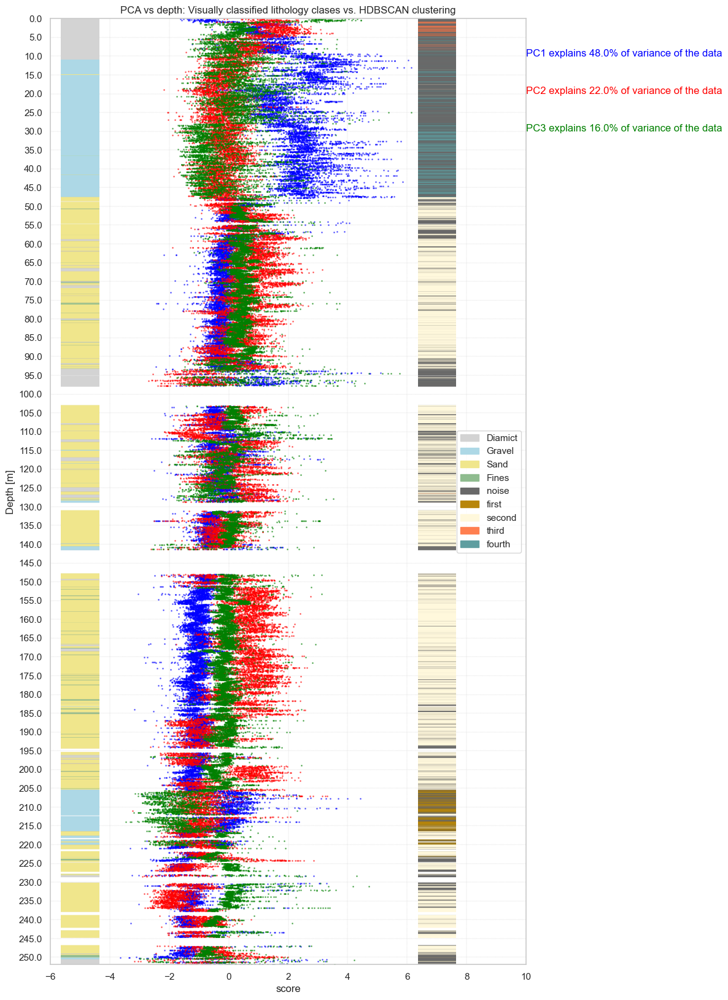

In [499]:
# Depth plots
# recalling and setting up needed data for plotting
pc1 = df_segm_pca_hdb['PC1']
pc2 = df_segm_pca_hdb['PC2']
pc3 = df_segm_pca_hdb['PC3']
depth = df_segm_pca_hdb['Composite_depth [cm]']
label = df_segm_pca_hdb['label'] 
label_hdb = df_segm_pca_hdb['HDBSCAN cluster labels'] 
colors_label_hdb = label_hdb.map(color_label_hdb_dict)
exp_var = np.round(pca_summary_table.iloc[0:3,-1],2)*100

# creating litho patches for legend
patch_list_hdb = [0] * len(labels_hdb)
for i in range(len(labels_hdb)):
    patch_list_hdb[i] = mpatches.Patch(color=color_hdb[i], label=labels_hdb[i])

# colors for PC data points and text
color_pc = ['blue','red','green']

# setting up figure size
fig16= plt.figure(figsize=(10,20))
# plots
#plt.plot(pc1,depth,'bo',pc2,depth,'ro',pc3,depth,'go',ms = 1, alpha=0.5)#pca
plt.plot(pc1, depth, 'o', color='blue', ms=1, alpha=0.5) 
plt.plot(pc2, depth, 'o', color='red', ms=1, alpha=0.5) 
plt.plot(pc3, depth, 'o', color='green', ms=1, alpha=0.5)
plt.scatter(np.full(len(depth),-5),depth, c = color_labels, marker="_", s=2000) # litho
plt.scatter(np.full(len(depth),7),depth, c = colors_label_hdb, marker="_", s=2000 ) # litho

# legends
# legend_pca = plt.legend(axis_labels,loc="upper right") # pca
legend_litho = plt.legend(handles=patch_list+patch_list_hdb,loc="center right") # litho
#plt.gca().add_artist(legend_pca) # displaying aditional legend

# axis parameters and proberties
# y-axis
plt.yticks(np.arange(0,max(depth),500), np.arange(0,max(depth/100),5))
plt.ylim(max(depth),0)
plt.ylabel('Depth [m]')
# x-axis
plt.xlim(-6,10)
plt.xlabel('score')

# other settings
plt.grid(ls = '--', lw = 0.3) # grid
plt.title('PCA vs depth: Visually classified lithology clases vs. HDBSCAN clustering')# plot title
# text
for i,v in enumerate(exp_var):
    plt.text(10,(i+1)*1000,f'{axis_labels[i]} explains {v}% of variance of the data', c=color_pc[i])


#### 4.4.2.2 HDBSCAN of full log data

In [500]:
# Model fit
hdb_log = hdbscan.HDBSCAN(min_cluster_size=100, min_samples=5)
hdb_log.fit(log_df_depth.iloc[:,0:3])

# Updating dataframe with cluster labels 
df_segm_log_hdb = log_df_depth
df_segm_log_hdb['HDBSCAN log segments'] =  hdb_log.labels_

# Displaying unique values of the cluster column to see how many clusters were formed and decide on best parameters for model
display(df_segm_log_hdb)
print(df_segm_log_hdb['HDBSCAN log segments'].unique())
print(df_segm_log_hdb['HDBSCAN log segments'].value_counts())

,Dens [g/cc],Mag_Sus BS_cor [SI x 10^-5],Nat_Gamma [cps],label,Composite_depth [cm],Segments K-means,K-means cluster labels,HDBSCAN log segments,HDBSCAN cluster labels
0,-4.186496,0.090903,0.421912,Diamict,13.403263,0,first,-1,noise
1,-4.010485,0.075136,0.490517,Diamict,13.986014,0,first,-1,noise
2,-3.658463,0.067252,1.193720,Diamict,14.568765,0,first,-1,noise
3,-3.013089,0.083019,0.696332,Diamict,15.151515,0,first,-1,noise
4,-2.719737,0.090903,1.228023,Diamict,15.734266,0,first,-1,noise
...,...,...,...,...,...,...,...,...,...
40271,-0.314253,4.095749,-0.795831,Diamict,25191.800000,1,second,-1,noise
40272,-0.607604,4.537228,0.421912,Diamict,25192.300000,1,second,-1,noise
40273,-1.252978,5.065427,-0.607167,Diamict,25192.800000,1,second,-1,noise
40274,-2.133034,5.672460,0.250399,Diamict,25193.300000,1,second,-1,noise


[-1  3  1  0  2]
HDBSCAN log segments
 3    23583
-1    14643
 0     1465
 2      483
 1      102
Name: count, dtype: int64


In [501]:
# After deciding optimum parameters, provide labels to the "segments" or numerical values of the clusters for plotting
df_segm_log_hdb['HDBSCAN cluster labels']=df_segm_log_hdb['HDBSCAN log segments'].map({-1:'noise',0:'first',1:'second',2:'third',3:'fourth'}) 
display(df_segm_log_hdb.head())

,Dens [g/cc],Mag_Sus BS_cor [SI x 10^-5],Nat_Gamma [cps],label,Composite_depth [cm],Segments K-means,K-means cluster labels,HDBSCAN log segments,HDBSCAN cluster labels
0,-4.186496,0.090903,0.421912,Diamict,13.403263,0,first,-1,noise
1,-4.010485,0.075136,0.490517,Diamict,13.986014,0,first,-1,noise
2,-3.658463,0.067252,1.193720,Diamict,14.568765,0,first,-1,noise
3,-3.013089,0.083019,0.696332,Diamict,15.151515,0,first,-1,noise
4,-2.719737,0.090903,1.228023,Diamict,15.734266,0,first,-1,noise


##### HDB log 3D Plots

In [502]:
# 3D Plots
# setting up the needed data
# calling the transformed data from PCA 1 to 3 for 3D plot

labels_hdb = ['noise','first','second','third','fourth']
color_hdb = ['dimgray','gold','mediumseagreen','slateblue','firebrick']
color_label_hdb_dict = dict(zip(labels_hdb,color_hdb))

# recalling and setting up needed data for plotting
ax1 = df_segm_log_hdb['Dens [g/cc]']
ax2 = df_segm_log_hdb['Mag_Sus BS_cor [SI x 10^-5]']
ax3 = df_segm_log_hdb['Nat_Gamma [cps]']
depth = df_segm_log_hdb['Composite_depth [cm]']
label = df_segm_log_hdb['label'] 
label_hdb = df_segm_log_hdb['HDBSCAN cluster labels'] 
color_labels = label.map(color_label_dict)
colors_label_hdb = label_hdb.map(color_label_hdb_dict)
#exp_var = np.round(pca_summary_table.iloc[0:3,-1],2)*100


# settings for subplot
fig17 = make_subplots(rows=2, cols=1,subplot_titles=('Visual','HDBSCAN'),vertical_spacing= 0.1,
                      specs=[[{'type': 'scene'}],[{'type': 'scene'}]])

# title
fig17.update_layout(autosize=False,height=1200, width=600,
                    title_text="3D-scatter plots of MSCL log data: Visual vs HDBSCAN clustering")

# plotting the color-coded data
fig17.append_trace(go.Scatter3d(x = ax1,y =ax2,z=ax3,mode='markers',marker=dict(color=color_labels)), row=1, col=1)
fig17.append_trace(go.Scatter3d(x = ax1,y =ax2,z=ax3,mode='markers',marker=dict(color=colors_label_hdb)), row=2, col=1)


# setting the axis limits
fig17.update_scenes(dict(xaxis=dict(nticks=10, range=[-7,7]),
                                yaxis=dict(nticks=10, range=[-7,7]),
                                zaxis=dict(nticks=10, range=[-7,7])))   
             

# setting axis labels
fig17.update_scenes(xaxis_title_text='Density [g/cc]',yaxis_title_text='Mag. Susceptibility', zaxis_title_text='Natural Gamma')

# hiding legend
fig17.update_layout(showlegend=False)


# updating marker size
fig17.update_scenes(aspectmode='cube')
fig17.update_traces(marker_size=1)
fig17.show()

##### HDB log Depth Plot

Text(0.5, 1.0, 'Normalised MSCL logs vs depth: Visually classified lithology clases vs HDBSCAN clustering')

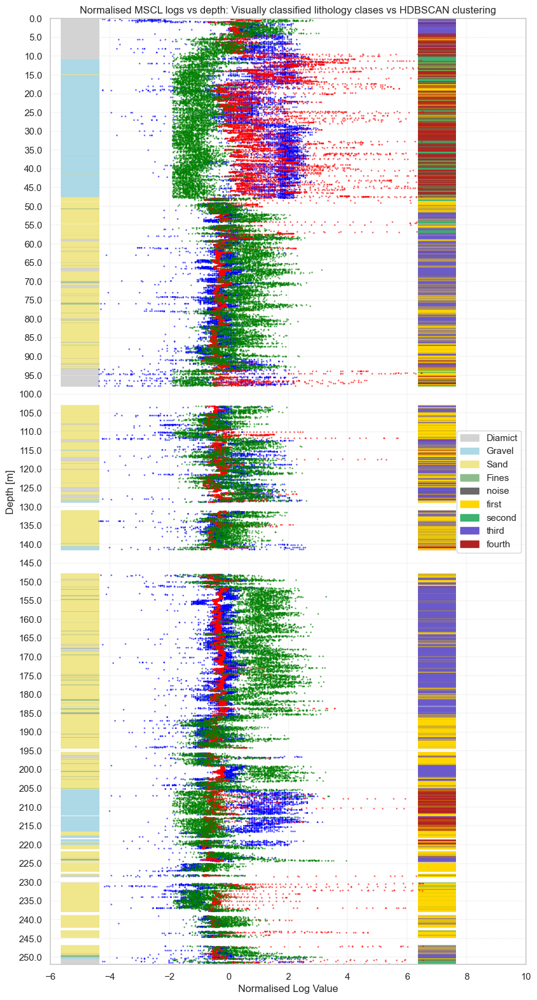

In [514]:
##### bug with the HDB patch colors here ####

# Depth plots
# recalling and setting up needed data for plotting
ax1 = df_segm_log_hdb['Dens [g/cc]']
ax2 = df_segm_log_hdb['Mag_Sus BS_cor [SI x 10^-5]']
ax3 = df_segm_log_hdb['Nat_Gamma [cps]']
depth = df_segm_log_hdb['Composite_depth [cm]']
label = df_segm_log_hdb['label'] 
label_hdb = df_segm_log_hdb['HDBSCAN cluster labels'] 
colors_label_hdb = label_kmean.map(color_label_hdb_dict)
#exp_var = np.round(pca_summary_table.iloc[0:3,-1],2)*100

# creating litho patches for legend
patch_list_hdb = [0] * len(labels_hdb)
for i in range(len(labels_hdb)):
    patch_list_hdb[i] = mpatches.Patch(color=color_hdb[i], label=labels_hdb[i])


# setting up figure size
fig18= plt.figure(figsize=(10,20))
# plots
plt.plot(ax1, depth, 'o', color='blue', ms=1, alpha=0.5) 
plt.plot(ax2, depth, 'o', color='red', ms=1, alpha=0.5) 
plt.plot(ax3, depth, 'o', color='green', ms=1, alpha=0.5)
plt.scatter(np.full(len(depth),-5),depth, c =color_labels, marker="_", s=2000) # litho
plt.scatter(np.full(len(depth),7),depth, c =colors_label_kmean, marker="_", s=2000 ) # litho

# legends
# legend_pca = plt.legend(axis_labels,loc="upper right") # pca
legend_litho = plt.legend(handles=patch_list+patch_list_hdb,loc="center right") #litho
#plt.gca().add_artist(legend_pca) # displaying aditional legend

# axis parameters and proberties
# y-axis
plt.yticks(np.arange(0,max(depth),500), np.arange(0,max(depth/100),5))
plt.ylim(max(depth),0)
plt.ylabel('Depth [m]')
# x-axis
plt.xlim(-6,10)
plt.xlabel('Normalised Log Value')

# other settings
plt.grid(ls = '--', lw = 0.3) # grid
plt.title('Normalised MSCL logs vs depth: Visually classified lithology clases vs HDBSCAN clustering') # plot title
# text
#for i,v in enumerate(exp_var):
#    plt.text(10,(i+1)*1000,f'{axis_labels[i]} explains {v}% of variance of the data', c=color_pc[i])


## 4.3 Classification (supervised)

In [ ]:
# Begin classification model scripts

# Select target column (with the numerical representation of the litho type labels)
target = 'litho types'

# Split data into training and testing sets

#X_train, X_test, y_train, y_test = train_test_split(df_reduced_cleaned_norm[features], df_reduced_cleaned_norm[target], test_size=0.2, random_state=42)

# Initialize StratifiedShuffleSplit (using a stratified split to ensure 
# sufficient distribution of each litho class in both train and test dataset)
strat_splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

# Perform the split
for train_index, test_index in strat_splitter.split(df_reduced_cleaned_norm[features], df_reduced_cleaned_norm[target]):
    x_train, x_test = df_reduced_cleaned_norm.iloc[train_index][features], df_reduced_cleaned_norm.iloc[test_index][features]
    y_train, y_test = df_reduced_cleaned_norm.iloc[train_index][target], df_reduced_cleaned_norm.iloc[test_index][target]


In [ ]:
# Seeing the shape of each re-shaped vector. 
# Note that (if above is correct), the total shape should have a row count that 
# adds up to 40256 (number of rows) x a row count of 4 (number of logs considered)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

In [ ]:
# 1. Create classifier model
multi_class = 'multinomial'
solver = 'lbfgs'
logreg_clf = LogisticRegression(solver=solver, multi_class=multi_class)

# 2. Initialize and train Logistic Regression model
t1 = timer()
logreg_clf.fit(x_train, y_train)
t2 = timer()
print ('training time: %.1fs'%(t2-t1))
# Now, the 'logreg_clf' classifier that we created above, is 'trained' 

# 3. Evaluate accuracy on train and test datasets
print("Training score : %.3f" % (logreg_clf.score(x_train, y_train)))
print("Test score : %.3f" % (logreg_clf.score(x_test, y_test)))
print()

# 4. Predict on the test set
y_p_test = logreg_clf.predict(x_test)
y_p_train = logreg_clf.predict(x_train)

# 5. Calculate the confusion matrix (CM) to evaluate the classifier's performance
cm_test = metrics.confusion_matrix(y_test, y_p_test)
cm_train = metrics.confusion_matrix(y_train, y_p_train) # Calculate the CM on the training set for a sanity check

cm = cm_test
# Print the accuracy using the CM (matches the accuracy from the score method)
accuracy = np.sum([cm[i, i] for i in range(4)]) / np.sum(cm)
print(f'The accuracy with the CM method is: {accuracy}. This should be the same as with the score method')
print()
# Evaluate the performance using a classification report and a printed visualisation of the confusion matrix
print("Classification Report:\n", metrics.classification_report(y_test, y_p_test))
print("Confusion Matrix:\n", metrics.confusion_matrix(y_test, y_p_test))


In [ ]:
# 6. Inspect the confusion metrics and compute using matrix manipulations the precision and recall for each category

# Create empty lists to store precision and recall values for each class
precisions = []
recalls = []

# Calculate precision for each class (0-3)
for i in range(4):
    precision = cm[i, i] / np.sum(cm[:, i])
    precisions.append(precision)

# Calculate recall for each class (0-3)
for i in range(4):
    recall = cm[i, i] / np.sum(cm[i, :])
    recalls.append(recall)

# Plot precision and recall values for each class using class names
plt.plot(labels, precisions, label='precision')  
plt.plot(labels, recalls, label='recall')  

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

plt.ylabel('Value below 1')

# Add a legend to the plot
plt.legend()

# Display the plot
#plt.show()

In [ ]:
# 7. Plot confusion matrix if desired

# Uncomment to calculate percentages by dividing each cell by the sum of the respective row (i.e., the total number of images that actually form part of the class "Row name")
cm_percentages = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Create a heatmap of the confusion matrix
plt.figure(figsize=(8, 6))
matrix = cm # cm_percentages
fmt = 'd' # 0.1%
sns.heatmap(matrix, annot=True, fmt=fmt, cmap='Greens', xticklabels=labels, yticklabels=labels)

# Add labels and title
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')

# Show the plot
plt.show()